In [1]:
!pip install rasterio albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 78.1 MB/s eta 0:00:00:00:0100:01


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tifffile as tiff
from sklearn.model_selection import train_test_split
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import albumentations as A
from albumentations import (
    HorizontalFlip, VerticalFlip, RandomBrightnessContrast, Rotate, Resize, Normalize, Compose,RandomRotate90, GaussNoise
)
from albumentations.pytorch import ToTensorV2
import rasterio
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Lambda 
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.5' (you have '2.0.4'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [2]:
dataset_path = "/kaggle/input/cloud-masking-dataset/content/train"
data_dir = os.path.join(dataset_path, 'data')
mask_dir = os.path.join(dataset_path, 'masks')
image_filenames = sorted([f for f in os.listdir(data_dir)])

train_filenames, val_filenames = train_test_split(
    image_filenames, 
    test_size=0.2, 
    random_state=42
)

print(f"Total images: {len(image_filenames)}")
print(f"Training set: {len(train_filenames)}")
print(f"Validation set: {len(val_filenames)}")

Total images: 10573
Training set: 8458
Validation set: 2115


In [ ]:
class CloudDataset(Dataset):
    def __init__(self, image_dir, mask_dir, filenames, transform=None):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.filenames = filenames
        self.transform = transform
        
    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        filename = self.filenames[idx]
        image_path = os.path.join(self.image_dir, filename)
        mask_path = os.path.join(self.mask_dir, filename)
        image = tiff.imread(image_path)  
        mask = tiff.imread(mask_path)    
        image = torch.from_numpy(image).permute(2, 0, 1).float()  
        mask = torch.from_numpy(mask).unsqueeze(0).float()        
        if self.transform:
            image = self.transform(image)
            mask = self.transform(mask)
        return image, mask



channel_transform = Lambda(lambda x: x[-2:, :, :]) 

train_dataset = CloudDataset(
    data_dir,
    mask_dir,
    train_filenames,
    transform=channel_transform 
)


BATCH_SIZE = 32
NUM_WORKERS = 4  
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True  
)


print(f"Total samples: {len(train_dataset)}")
for images, masks in train_loader:
    print(f"Batch images shape: {images.shape}")  
    print(f"Batch masks shape: {masks.shape}")    
    break

# Total samples: 8458
# Batch images shape: torch.Size([32, 2, 512, 512])
# Batch masks shape: torch.Size([32, 1, 512, 512])

Total samples: 8458
Batch images shape: torch.Size([32, 2, 512, 512])
Batch masks shape: torch.Size([32, 1, 512, 512])


In [ ]:
channel_transform = Lambda(lambda x: x[-2:, :, :])  

val_dataset = CloudDataset(
    data_dir,
    mask_dir,
    val_filenames,
    transform=channel_transform  
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True 
)

print(f"Total validation samples: {len(val_dataset)}")
for images, masks in val_loader:
    print(f"Batch images shape: {images.shape}")  
    print(f"Batch masks shape: {masks.shape}")    
    break  


# Total validation samples: 2115
# Batch images shape: torch.Size([32, 2, 512, 512])
# Batch masks shape: torch.Size([32, 1, 512, 512])


Total validation samples: 2115
Batch images shape: torch.Size([32, 2, 512, 512])
Batch masks shape: torch.Size([32, 1, 512, 512])


In [ ]:
def calculate_indices(img_tensor):
    band1 = img_tensor[:, 0:1]  
    band2 = img_tensor[:, 1:2]  
    
    eps = 1e-6  
    ndsi = (band1 - band2) / (band1 + band2 + eps)  
    brightness = (band1 + band2) / 2  
    ratio = band2 / (band1 + eps) 
    
    enhanced = torch.cat([
        img_tensor,      
        ndsi,            
        brightness,      
        ratio            
    ], dim=1)  
    
    return enhanced

def prepare_svm_data(loader, max_samples=50000):
    cloud_pixels = []
    clear_pixels = []
    
    for images, masks in tqdm(loader, desc="Preparing data"):
        enhanced_images = calculate_indices(images)  
        pixels = enhanced_images.permute(0, 2, 3, 1).reshape(-1, enhanced_images.shape[1])
        labels = masks.view(-1)
        
        cloud_mask = labels == 1
        cloud_pixels.append(pixels[cloud_mask].numpy())
        clear_pixels.append(pixels[~cloud_mask].numpy())
        if min(len(np.concatenate(cloud_pixels)), len(np.concatenate(clear_pixels))) >= max_samples//2:
            break
    
    X = np.vstack([
        np.concatenate(cloud_pixels)[:max_samples//2],
        np.concatenate(clear_pixels)[:max_samples//2]
    ])
    y = np.concatenate([
        np.ones(max_samples//2),
        np.zeros(max_samples//2)
    ])
    
    return X, y

X_train, y_train = prepare_svm_data(train_loader, max_samples=10000)

svm_pipe = make_pipeline(
    StandardScaler(),  
    SVC(kernel='rbf', C=1.0, class_weight='balanced', verbose=True)
)
svm_pipe.fit(X_train, y_train)
def predict_full_image(image):
    if isinstance(image, torch.Tensor):
        image = image.unsqueeze(0) if image.dim() == 3 else image
    
    enhanced = calculate_indices(image)
    pixels = enhanced.permute(0, 2, 3, 1).reshape(-1, enhanced.shape[1])
    
    preds = svm_pipe.predict(pixels.numpy())
    return preds.reshape(image.shape[2], image.shape[3])




Image 0 Dice: 0.2871


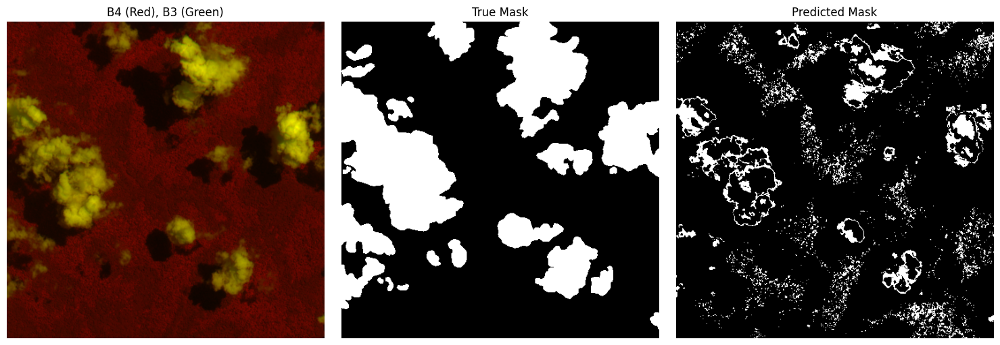


Image 1 Dice: 0.6967


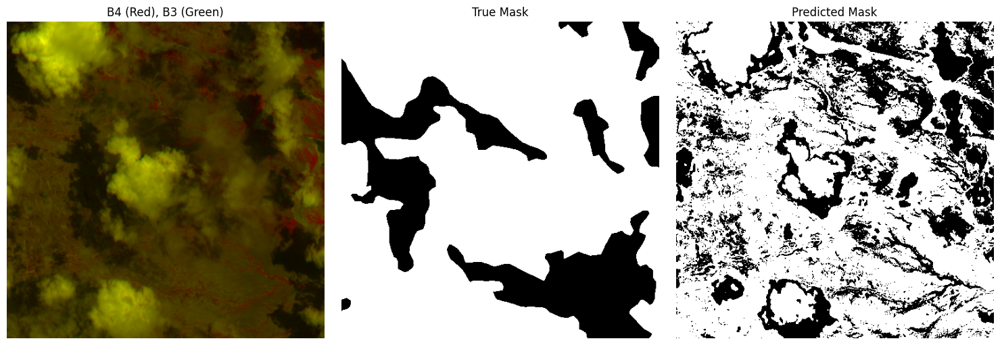


Image 2 Dice: 0.2303


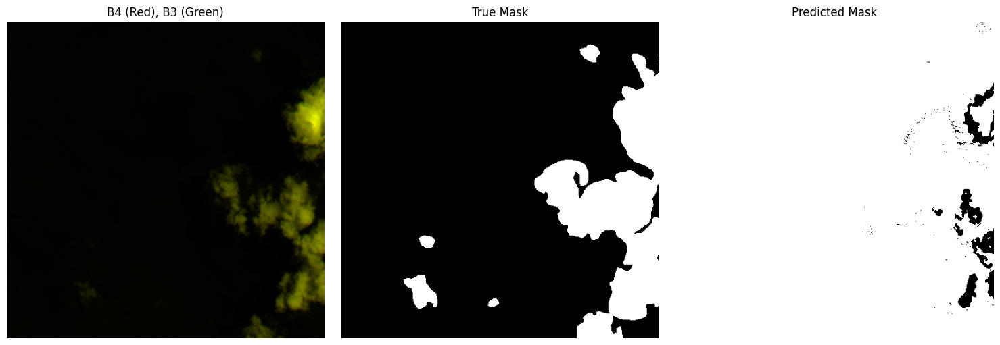


Image 3 Dice: 0.0055


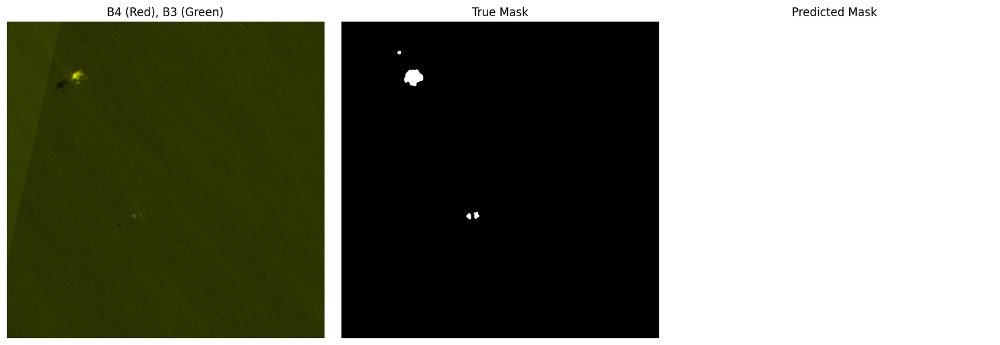


Image 4 Dice: 0.9993


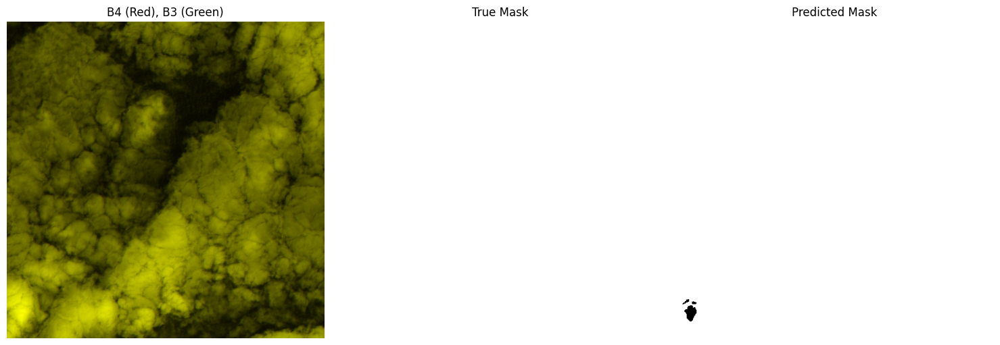


Image 5 Dice: 0.8335


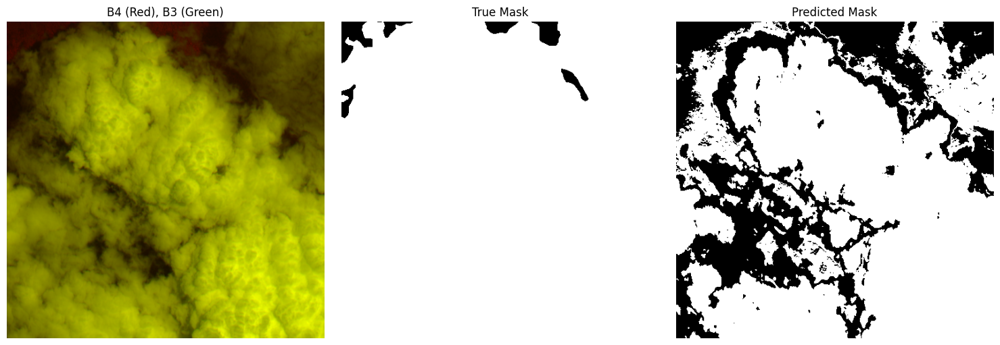


Image 6 Dice: 0.2978


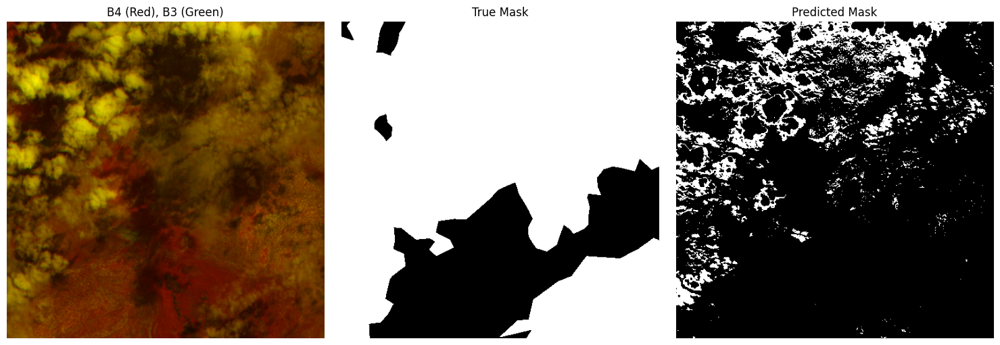


Image 7 Dice: 0.8699


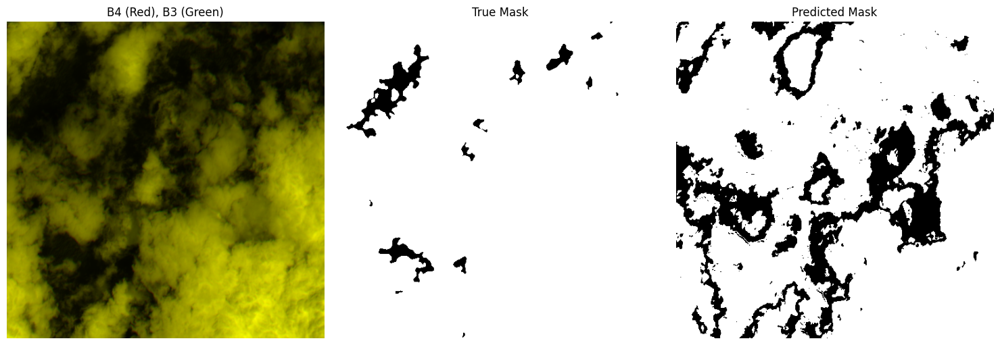


Image 8 Dice: 0.6548


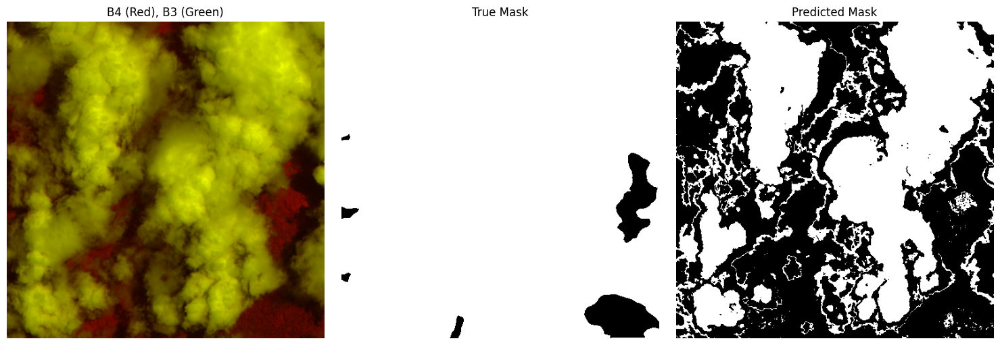


Image 9 Dice: 0.8206


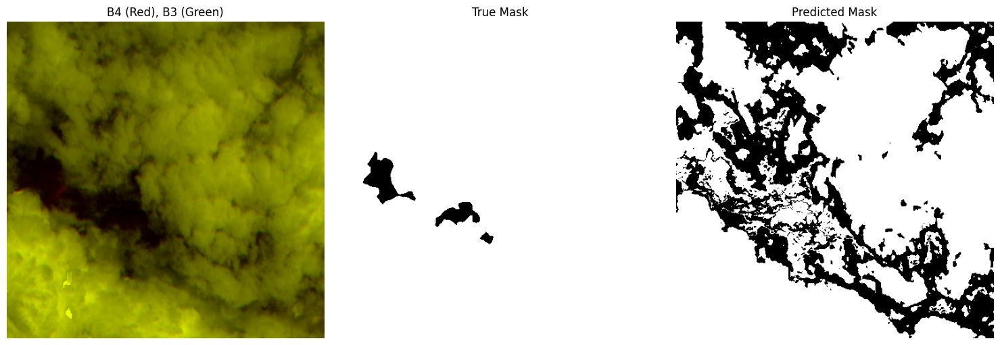


Image 10 Dice: 0.6343


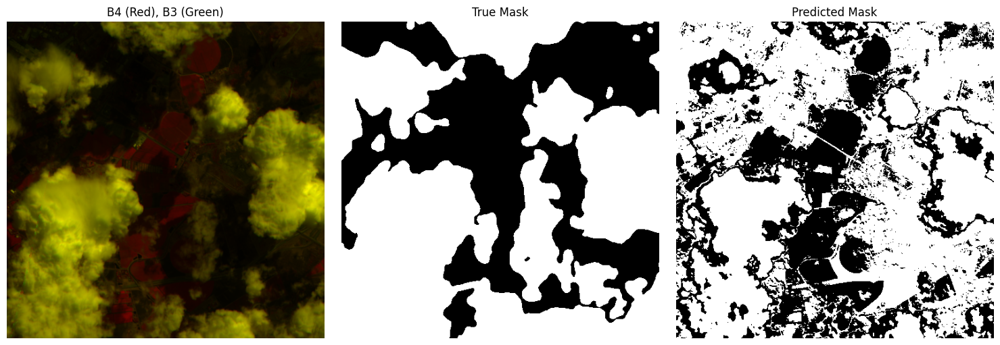


Image 11 Dice: 0.0000


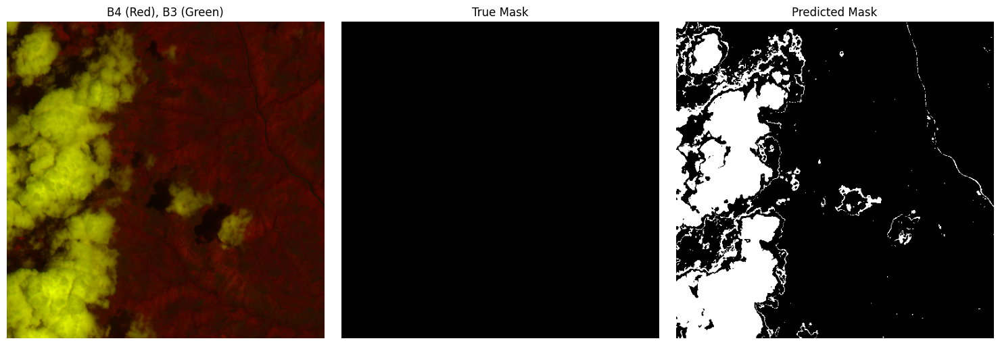


Image 12 Dice: 0.9955


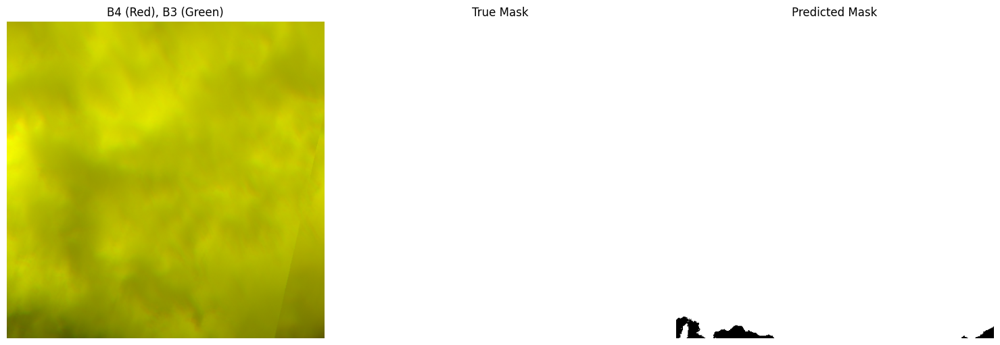


Image 13 Dice: 0.4684


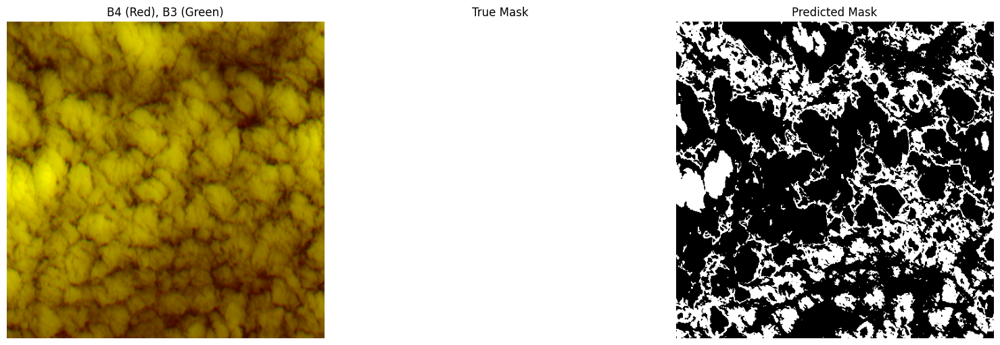


Image 14 Dice: 0.6926


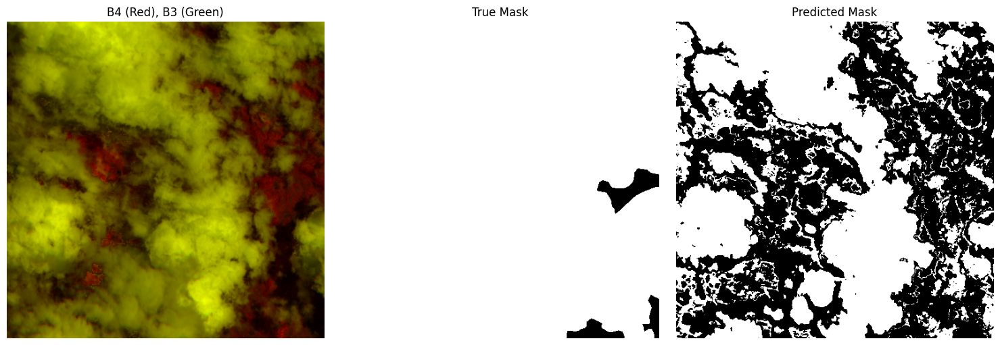


Image 15 Dice: 0.1056


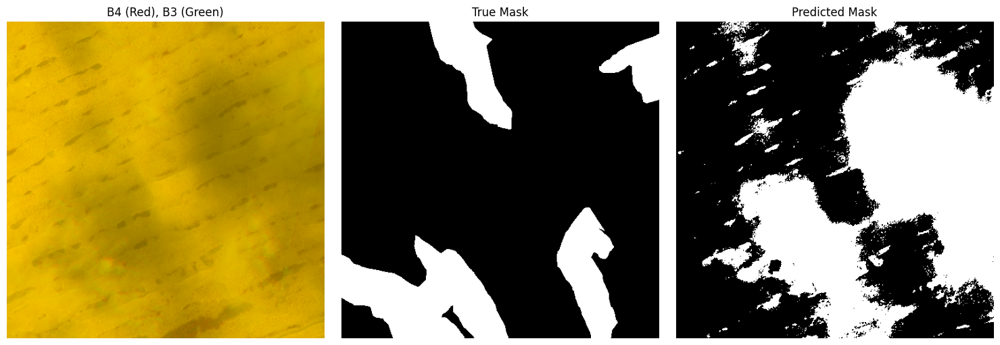


Image 16 Dice: 0.3342


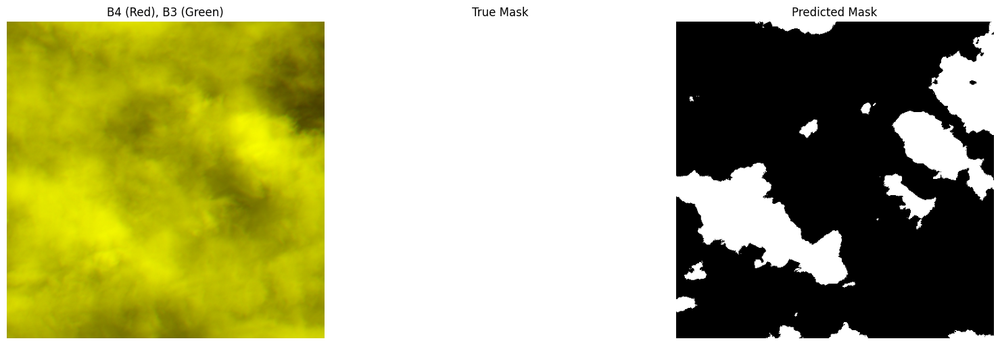


Image 17 Dice: 0.6999


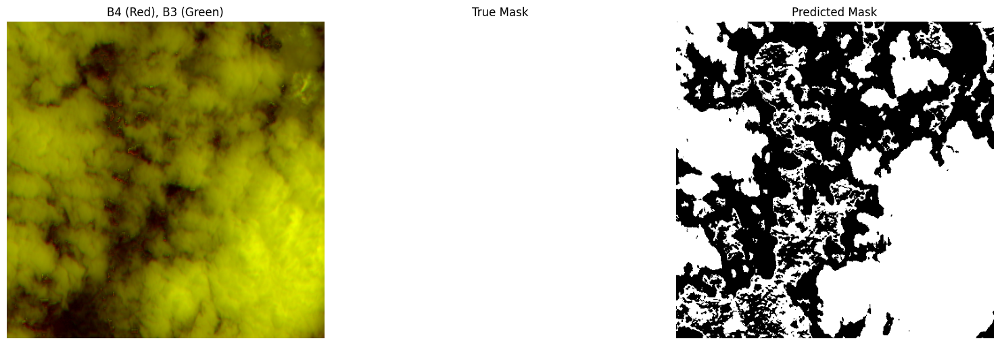


Image 18 Dice: 0.0000


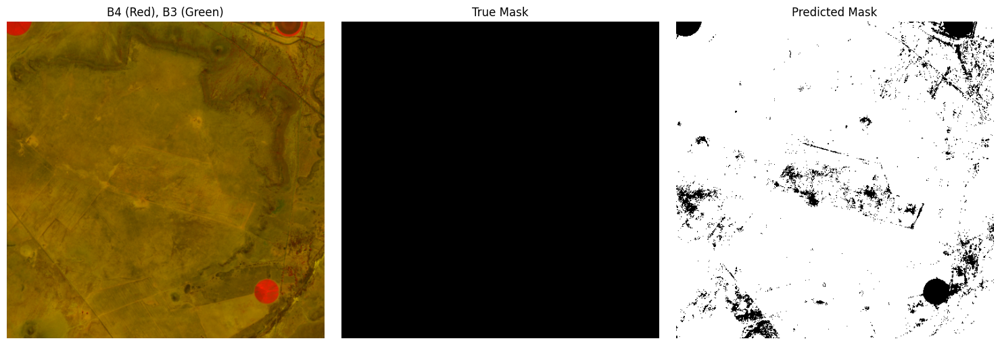


Image 19 Dice: 0.3059


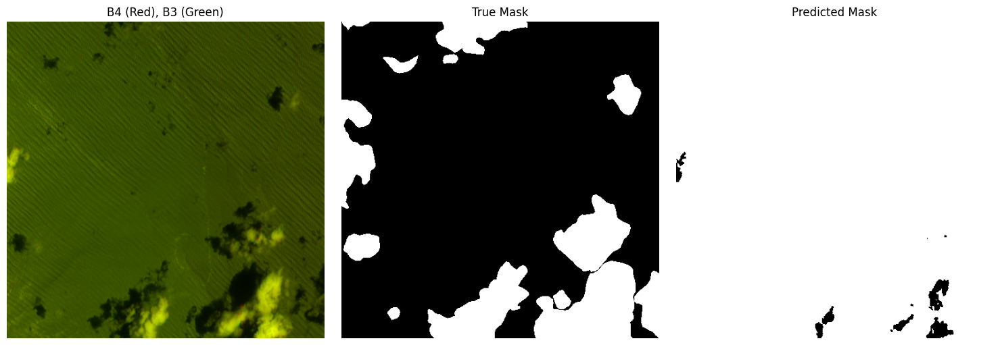


Image 20 Dice: 0.0094


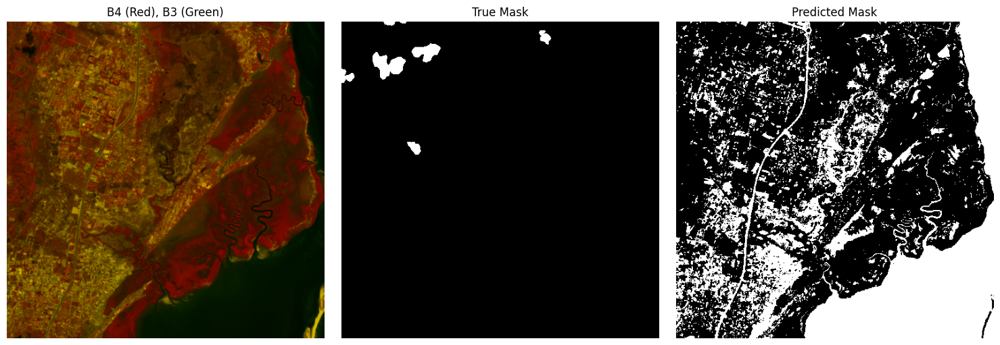


Image 21 Dice: 1.0000


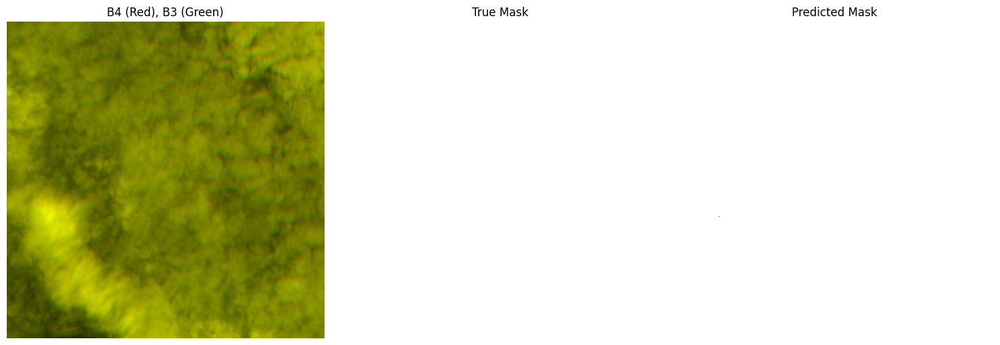


Image 22 Dice: 0.6271


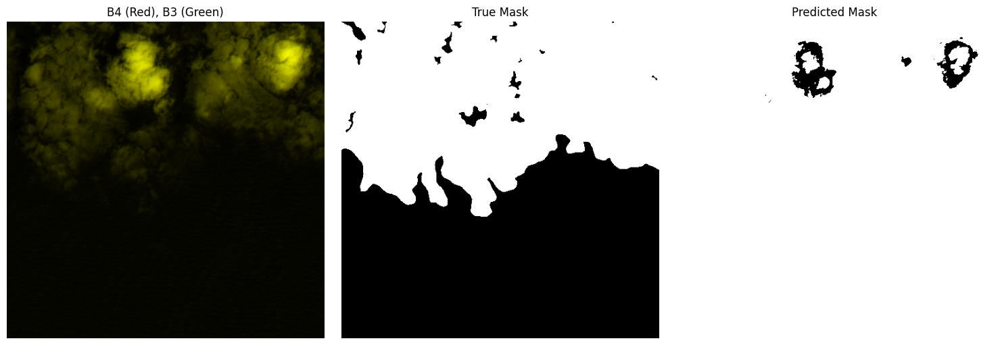


Image 23 Dice: 0.0991


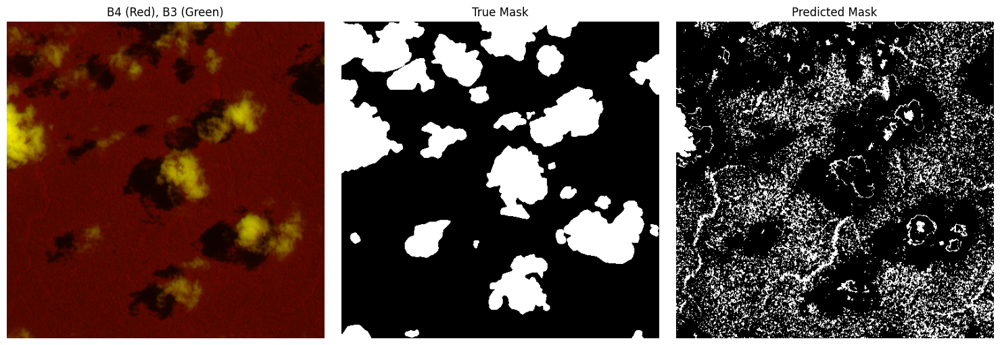


Image 24 Dice: 0.0000


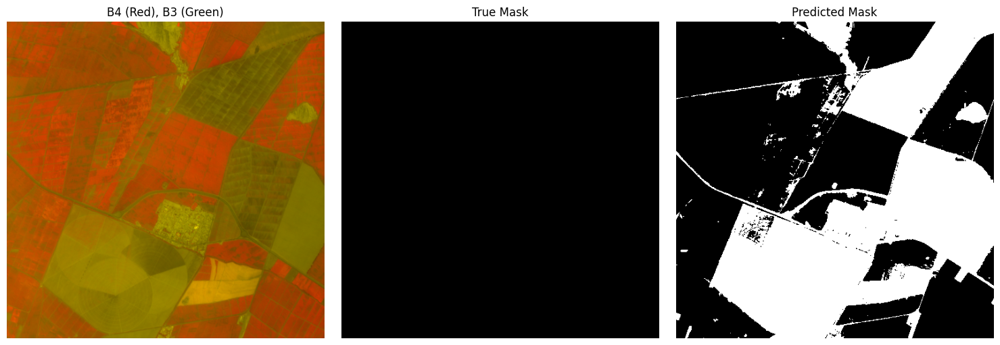


Image 25 Dice: 0.0767


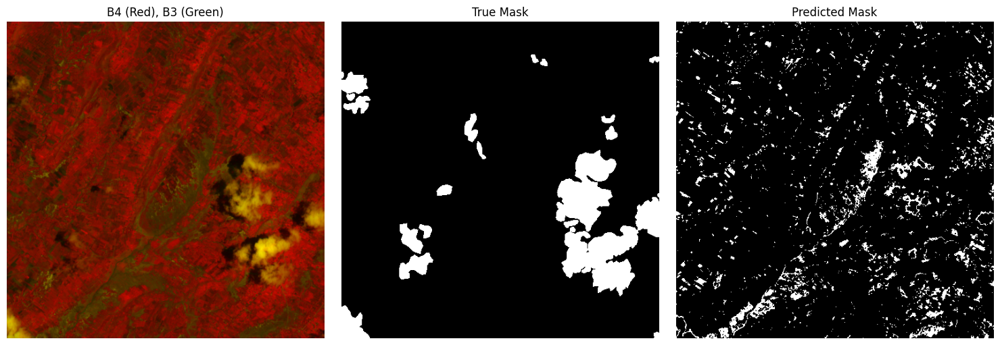


Image 26 Dice: 0.2722


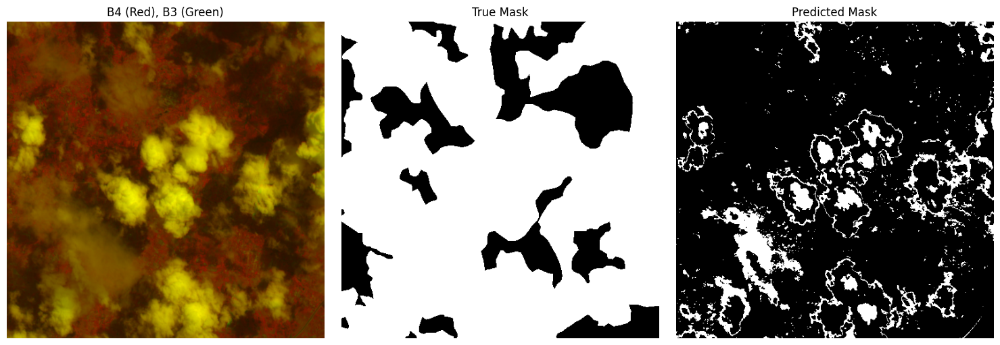


Image 27 Dice: 0.3896


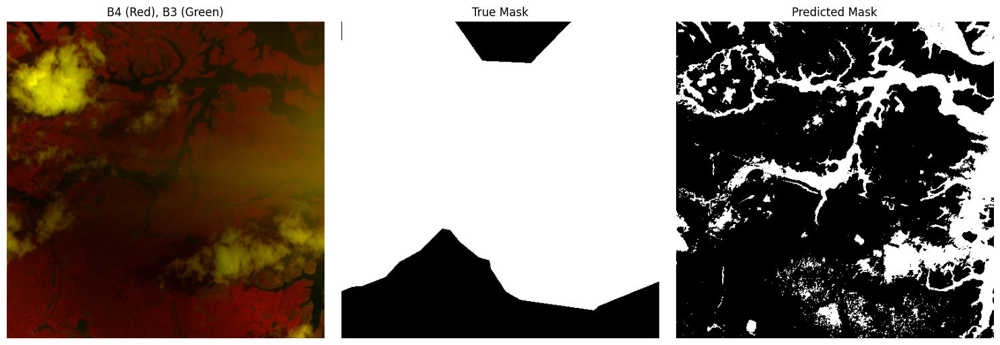


Image 28 Dice: 0.0733


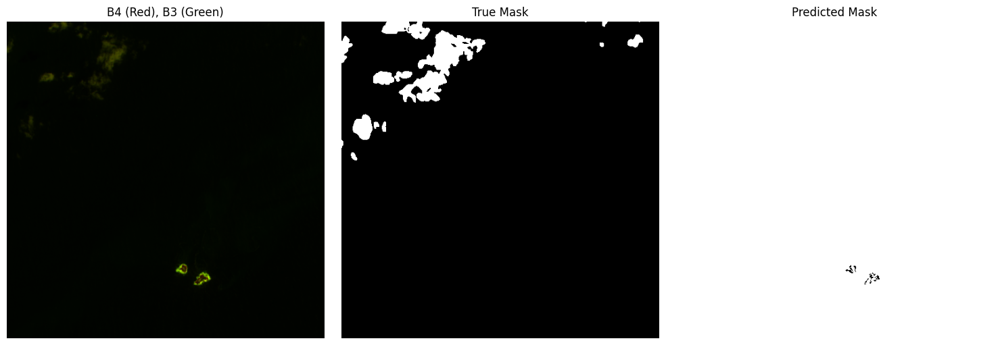


Image 29 Dice: 1.0000


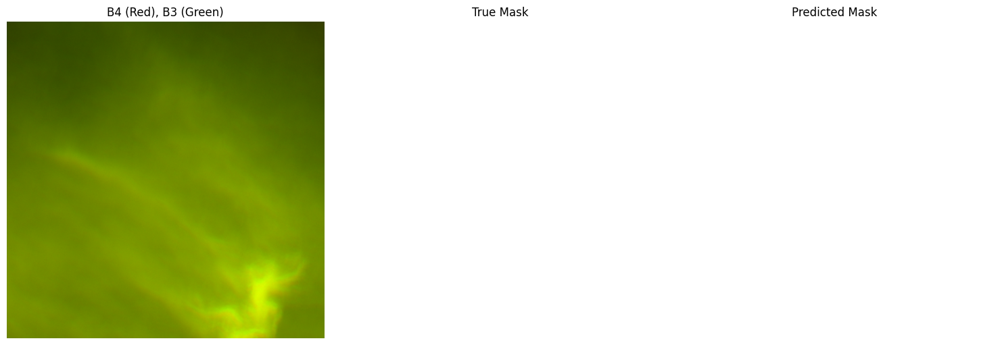

In [ ]:
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    if torch.is_tensor(y_true):
        y_true = y_true.cpu().numpy()
    if torch.is_tensor(y_pred):
        y_pred = y_pred.cpu().numpy()
    
    y_true = y_true.astype(np.float32)
    y_pred = y_pred.astype(np.float32)
    
    intersection = np.sum(y_true * y_pred)
    return (2. * intersection + smooth) / (np.sum(y_true) + np.sum(y_pred) + smooth)

def visualize_results(image, true_mask, pred_mask):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    vis_image = np.zeros((image.shape[0], image.shape[1], 3))
    vis_image[:, :, 0] = image[:, :, 1]  
    vis_image[:, :, 1] = image[:, :, 0]  
    vis_image = (vis_image - vis_image.min()) / (vis_image.max() - vis_image.min() + 1e-8)
    plt.imshow(vis_image)
    plt.title('B4 (Red), B3 (Green)')
    plt.axis('off')
    plt.subplot(1, 3, 2)
    if torch.is_tensor(true_mask):
        true_mask = true_mask.cpu().numpy()
    plt.imshow(true_mask.squeeze(), cmap='gray', vmin=0, vmax=1)
    plt.title("True Mask")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    if torch.is_tensor(pred_mask):
        pred_mask = pred_mask.cpu().numpy()
    plt.imshow(pred_mask.squeeze(), cmap='gray', vmin=0, vmax=1)
    plt.title("Predicted Mask")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

val_images, val_masks = next(iter(val_loader))
for i in range(min(30, val_images.shape[0])):
    img = val_images[i].cpu().numpy()  
    mask = val_masks[i].cpu().numpy()  
    pred = predict_full_image(val_images[i])  
    if torch.is_tensor(pred):
        pred = pred.cpu().numpy()
    
    img_dice = dice_coefficient(mask.flatten(), pred.flatten())
    print(f"\nImage {i} Dice: {img_dice:.4f}")
    
    visualize_results(
        img.transpose(1, 2, 0),  
        mask,                    
        pred                     
    )